# Grouping for Synthesis AI face dataset

At first, we install some dependencies.

Installing `face_api_dataset` from the github it it's not already installed.

In [1]:
%%bash

(python -c "import face_api_dataset")
if [ $? -eq 0 ]
then
    echo "face_api_dataset is already installed"
else
    echo "installing face_api_dataset from github"
    pip install git+https://github.com/Synthesis-AI-Dev/face_api_dataset.git
fi

face_api_dataset is already installed


Installing `git lfs` from the github it it's not already installed.

In [2]:
%%bash

(git lfs install > /dev/null)
if [ $? -eq 0 ]
then
    echo "git lfs is already installed"
else
    echo "installing git lfs"
    case "$(uname -s)" in

       Darwin)
         brew install git-lfs
         ;;

       Linux)
         curl -s https://packagecloud.io/install/repositories/github/git-lfs/script.deb.sh | sudo bash
         apt-get install git-lfs
         ;;

       *)
         echo "This cell can't install git lfs your OS. Please take care of it yourself."
         ;;
    esac
fi

git lfs is already installed


Pulling the test dataset for the example

In [3]:
%%bash

if [ -d "../test_dataset" ]
then
    echo "test_dataset is already present"
else
    echo "downloading test_dataset"
    git clone https://github.com/Synthesis-AI-Dev/face_api_dataset
    mv face_api_dataset/test_dataset ..
    rm -rf face_api_dataset
fi

test_dataset is already present


Finally we add some imports for the visualisation.

In [4]:
%matplotlib inline

In [5]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

We use `FaceApiDataset` class to access synthesis datasets.

In [6]:
from face_api_dataset import FaceApiDataset, Modality, Grouping

We have different options for groupping the dataset items. `grouping=Grouping.None` was set be default in previous examples so we will showcase more advanced cases.

If `grouping=Grouping.None` is set, then each image is treated independently.
The size of the dataset is **#scenes** * **#cameras** * **#frames**.

In [7]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.NONE)

len(dataset)

86

In [8]:
def show_items(items):
    fig = plt.figure(figsize=(20, 20))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(3, 3),
                     axes_pad=0.3,
                     )

    for ax, frame in zip(grid, items):
        ax.imshow(frame[Modality.RGB])
        title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.RENDER_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
        ax.set_title(title)
    plt.show()

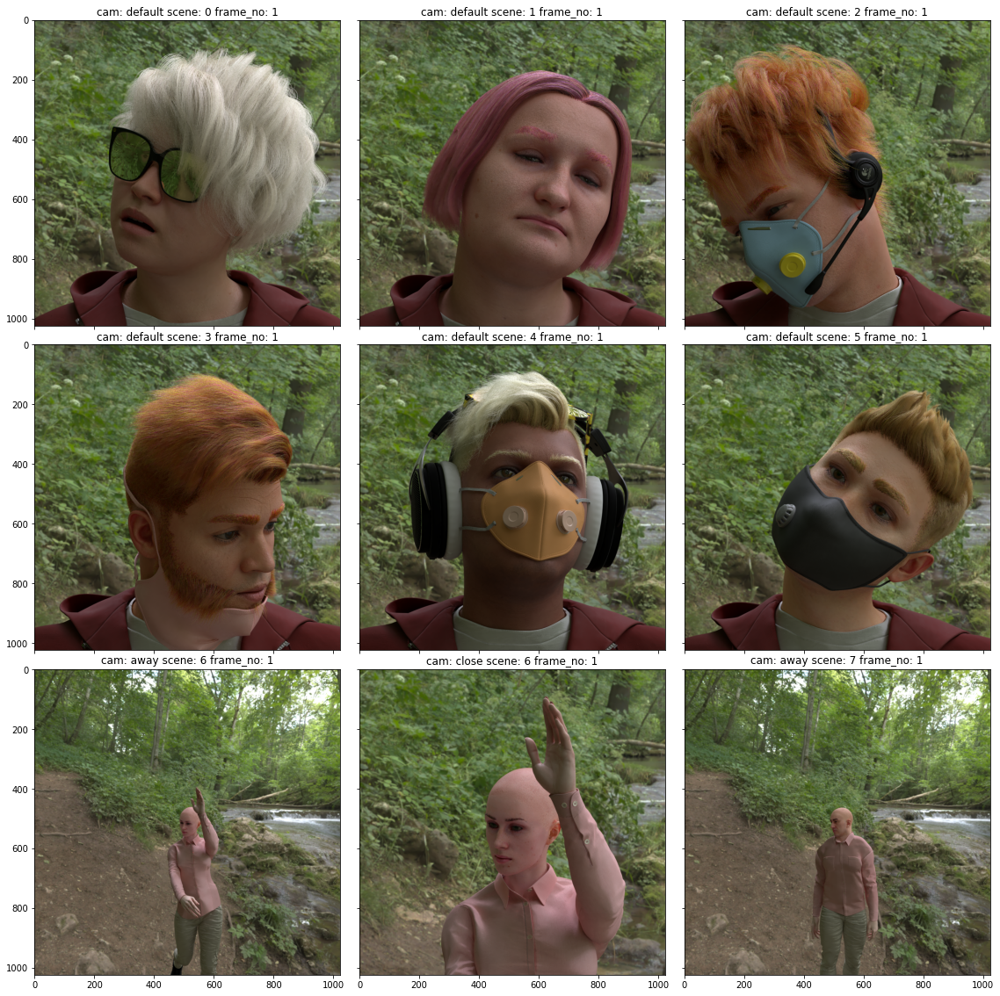

In [9]:
show_items(dataset)

If `grouping=Grouping.CAMERA` is set, then all items with the same camera are grouped into the list.

The size of the dataset is **#cameras**.

In [10]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.CAMERA)

len(dataset)

3

In [11]:
group = dataset[1]
len(group)

40

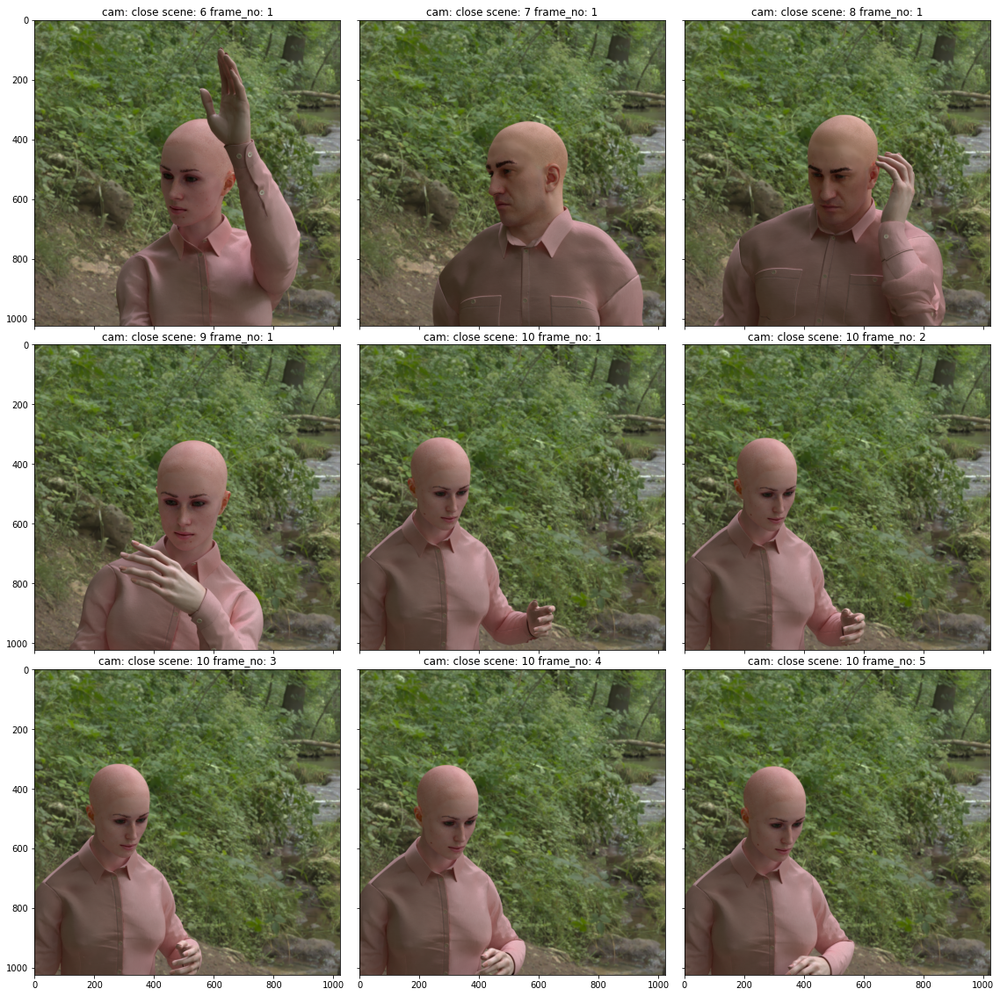

In [12]:
show_items(group)

If `grouping=Grouping.SCENE` is set, then all items with the same scene are grouped into the list.

The size of the dataset is **#scenes** , each element `List[Item]` is is a list of frames from all cameras from the same scene.

In [13]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.SCENE)

len(dataset)

13

In [14]:
group = dataset[10]

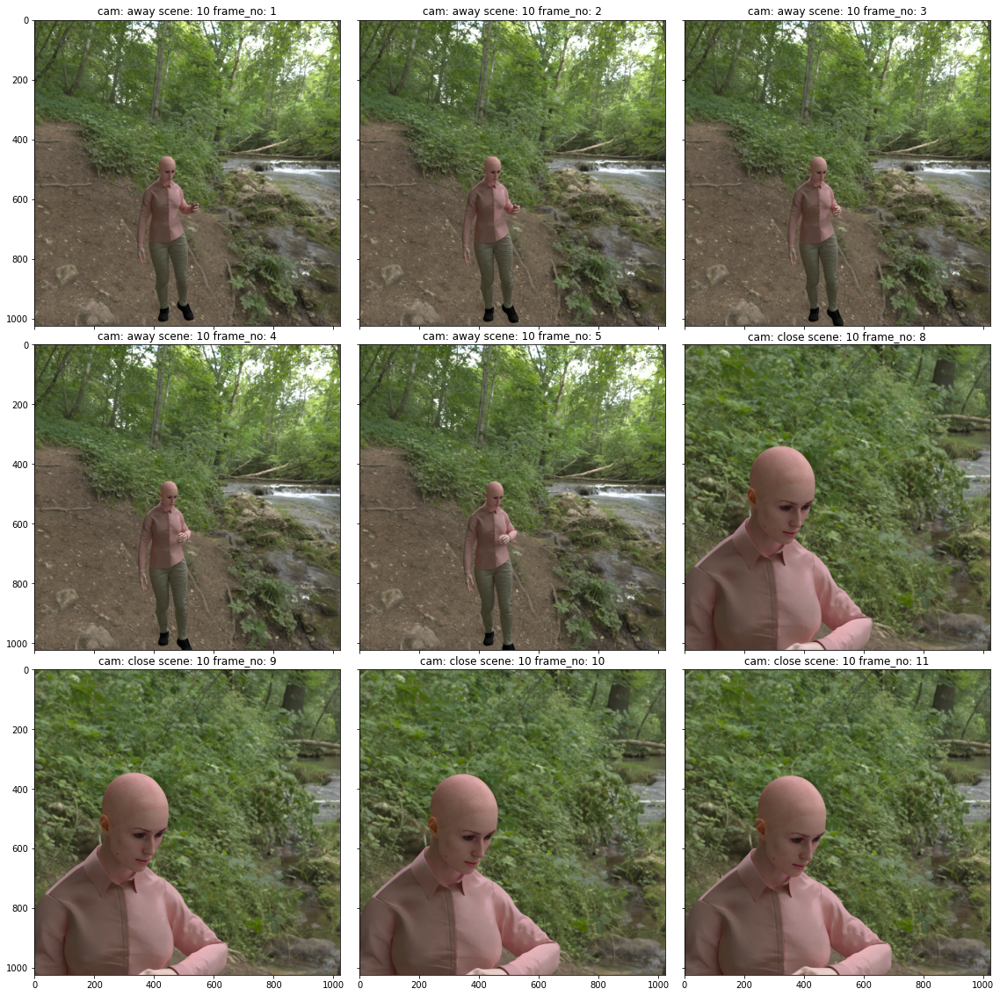

In [15]:
show_items(group[:5] + group[-5:])

If `grouping=Grouping.SCENE_CAMERA` is set, then all items are grouped first by camera and then by scene.

The size of the dataset is **#scenes** * **#cameras** , each element is a `List[Item]` is a list of consecutive frames for given scene and camera.

In [16]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.SCENE_CAMERA)

len(dataset)

20

In [17]:
group = dataset[15]

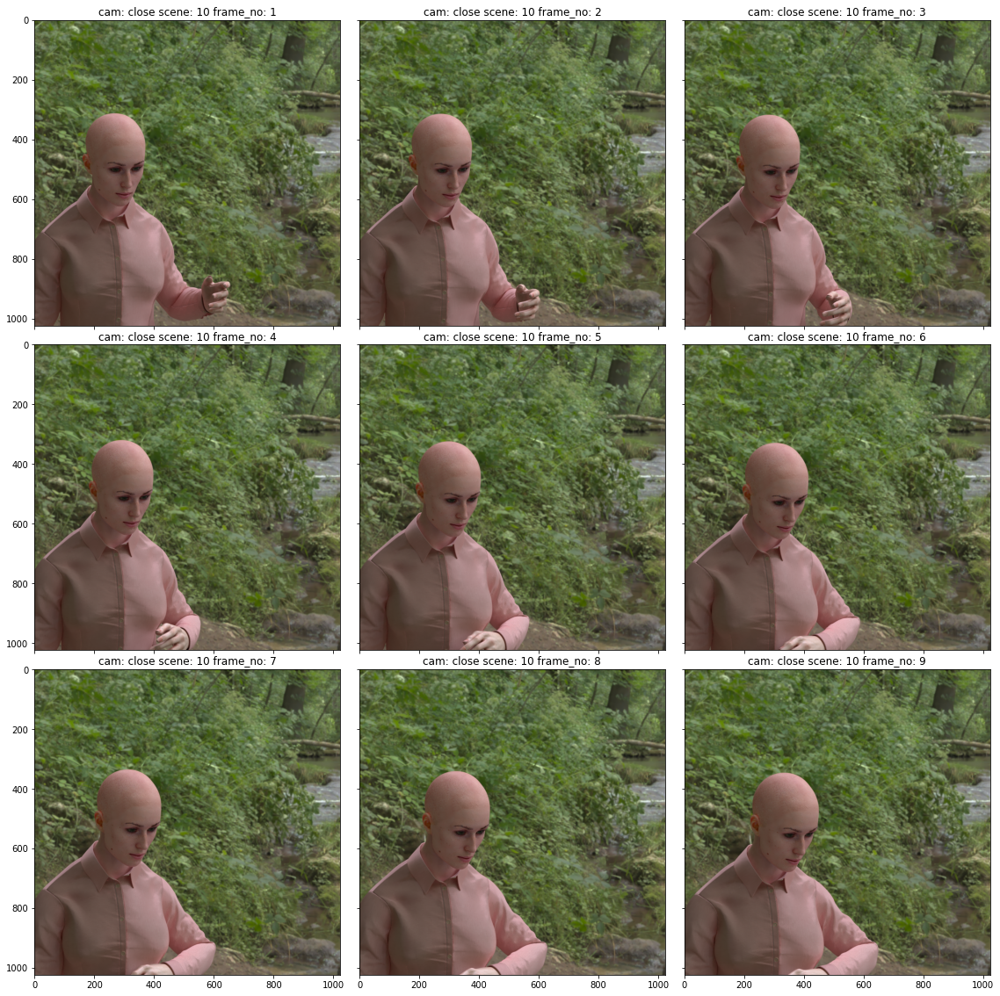

In [18]:
show_items(group)

In case you want to access your dataset items in a particular order, you can have direct access to grouping index calling `FaceApiDataset.get_group_index`

In [21]:
group_index = dataset.get_group_index()
group_index.head()

,render_id,camera_name
0,0,default
1,1,default
2,2,default
3,3,default
4,4,default


Let's get all groups with `render_id == 10`

In [46]:
query = group_index.query('render_id == 10')
query

,render_id,camera_name
14,10,away
15,10,close


Index  14


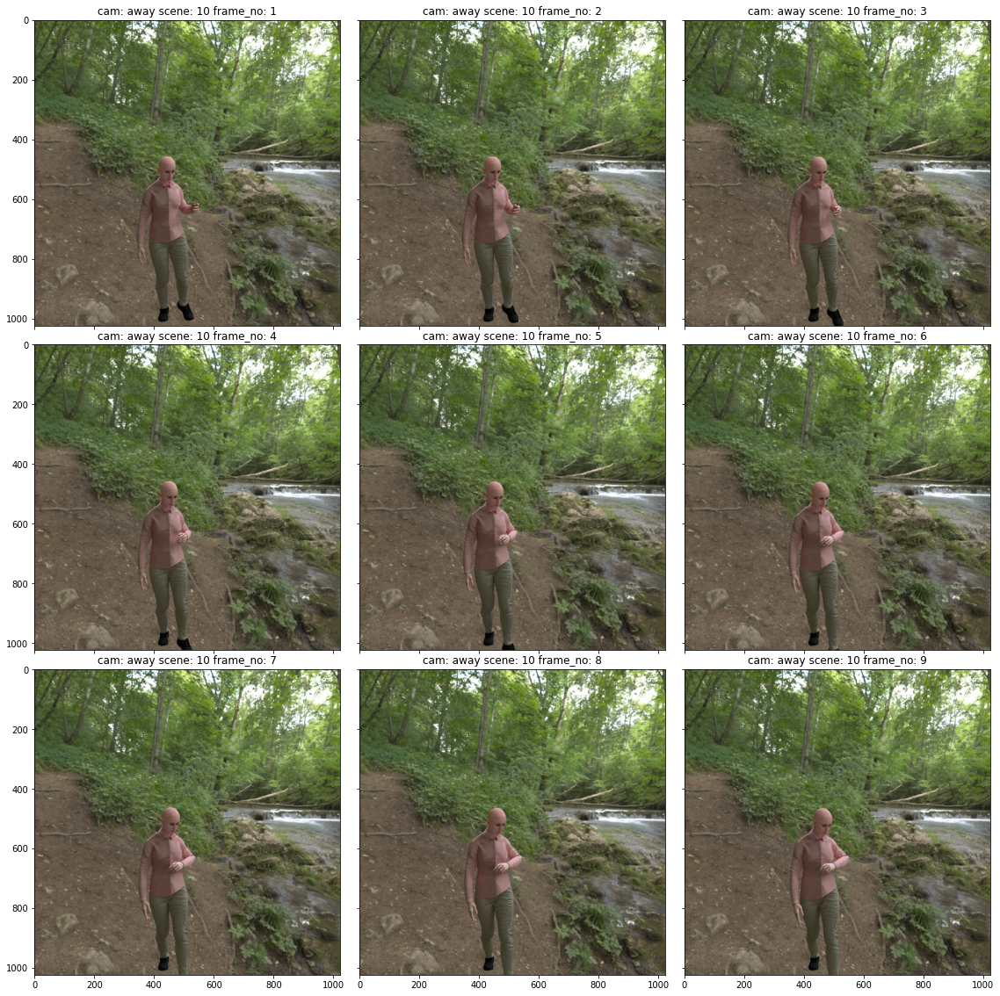

Index  15


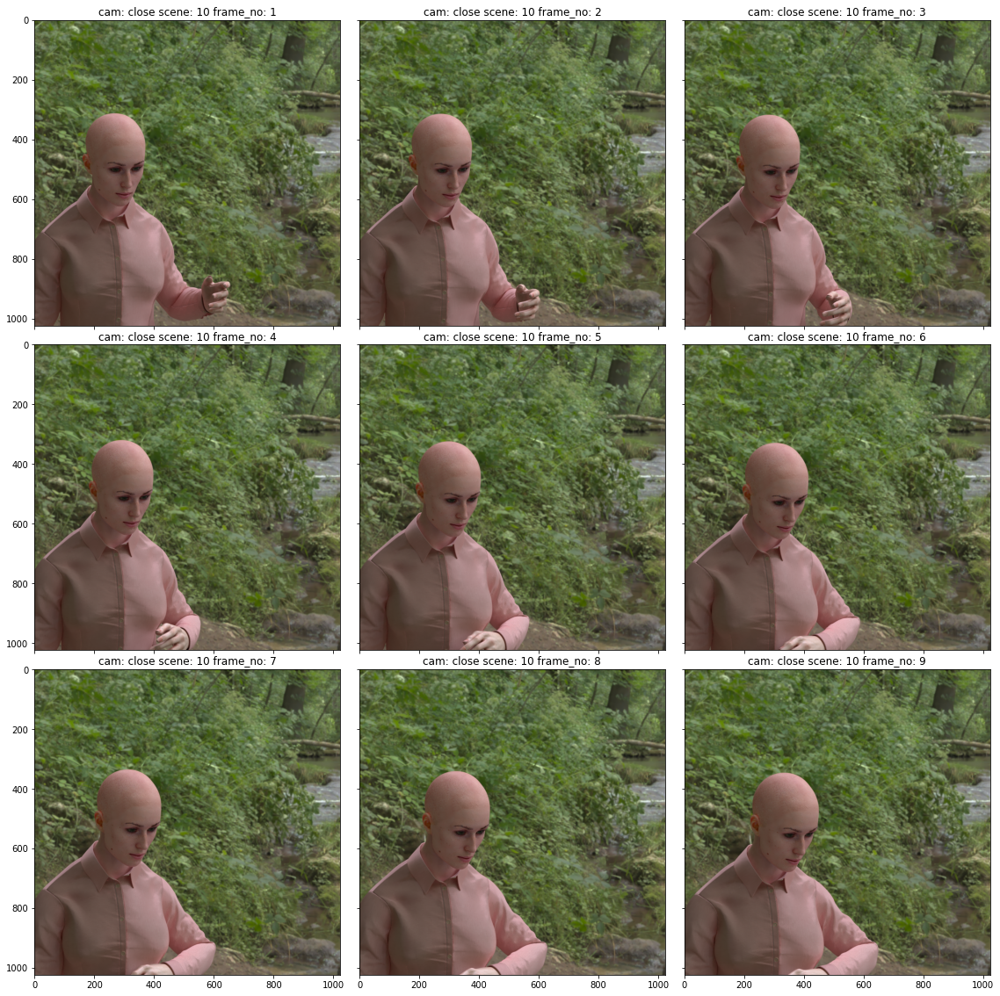

In [47]:
for idx in query.index:
    print("Index ", idx)
    group = dataset[idx]
    show_items(group)